In [3]:
import os
import urllib.request
import torch
from segment_anything import sam_model_registry
import warnings

warnings.filterwarnings("ignore", message="You are using `torch.load` with `weights_only=False`*")

# Force CPU
device = torch.device("cpu")
print("Using device:", device)

# Checkpoint (vit_b is fastest among SAM v1 models)
ckpt_url  = "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth"
ckpt_path = "sam_vit_b_01ec64.pth"
model_type = "vit_b"

# Download once if needed
if not os.path.exists(ckpt_path):
    print("Downloading checkpoint...")
    urllib.request.urlretrieve(ckpt_url, ckpt_path)
    print("Downloaded:", ckpt_path)
else:
    print("Checkpoint already exists:", ckpt_path)

# Load model
sam = sam_model_registry[model_type](checkpoint=ckpt_path)
sam.to(device)
sam.eval()

print("✅ SAM loaded on", device)

Using device: cpu
Checkpoint already exists: sam_vit_b_01ec64.pth
✅ SAM loaded on cpu



[notice] A new release of pip is available: 24.2 -> 25.3
[notice] To update, run: python -m pip install --upgrade pip



[notice] A new release of pip is available: 24.2 -> 25.3
[notice] To update, run: python -m pip install --upgrade pip



[notice] A new release of pip is available: 24.2 -> 25.3
[notice] To update, run: python -m pip install --upgrade pip



[notice] A new release of pip is available: 24.2 -> 25.3
[notice] To update, run: python -m pip install --upgrade pip



[notice] A new release of pip is available: 24.2 -> 25.3
[notice] To update, run: python -m pip install --upgrade pip



[notice] A new release of pip is available: 24.2 -> 25.3
[notice] To update, run: python -m pip install --upgrade pip



[notice] A new release of pip is available: 24.2 -> 25.3
[notice] To update, run: python -m pip install --upgrade pip



[notice] A new release of pip is available: 24.2 -> 25.3
[notice] To update, run: python -m pip install --upgrade pip


  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-itr9hiou


  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-itr9hiou


  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'



[notice] A new release of pip is available: 24.2 -> 25.3
[notice] To update, run: python -m pip install --upgrade pip


torch.cuda.is_available(): False
Using device: cpu
Original CRS: EPSG:32611
Original transform: | 3.00, 0.00, 380526.00|
| 0.00,-3.00, 3740661.00|
| 0.00, 0.00, 1.00|
RGB image shape (H, W, 3): (3852, 4316, 3)


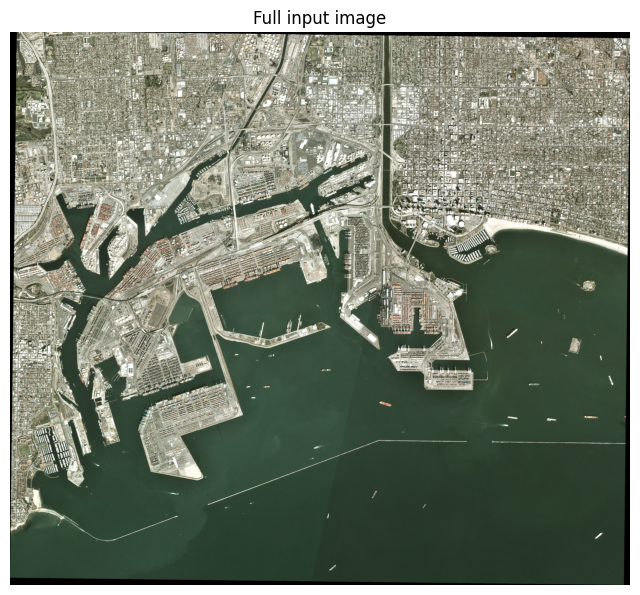

Saved 16 tiles in directory 'tiles_4x4'
Checkpoint already exists: sam_vit_h_4b8939.pth

Processing tile_r0_c0 ...


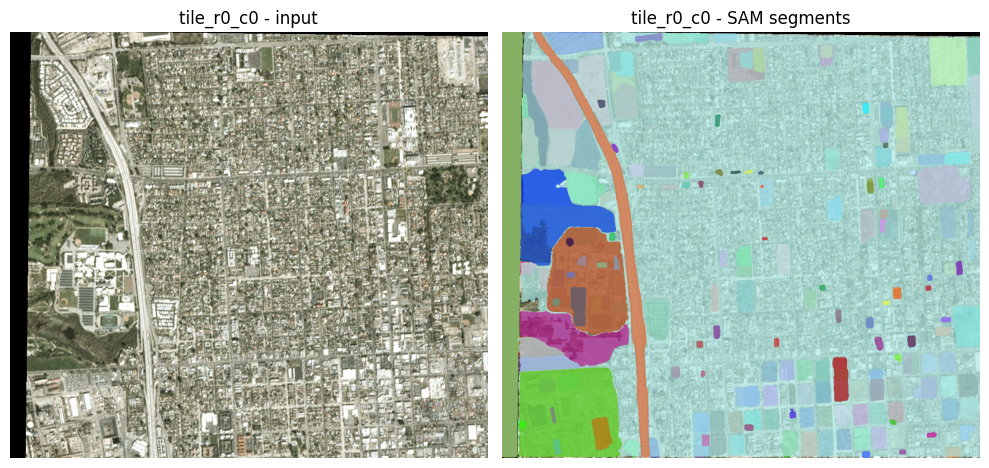


Processing tile_r0_c1 ...


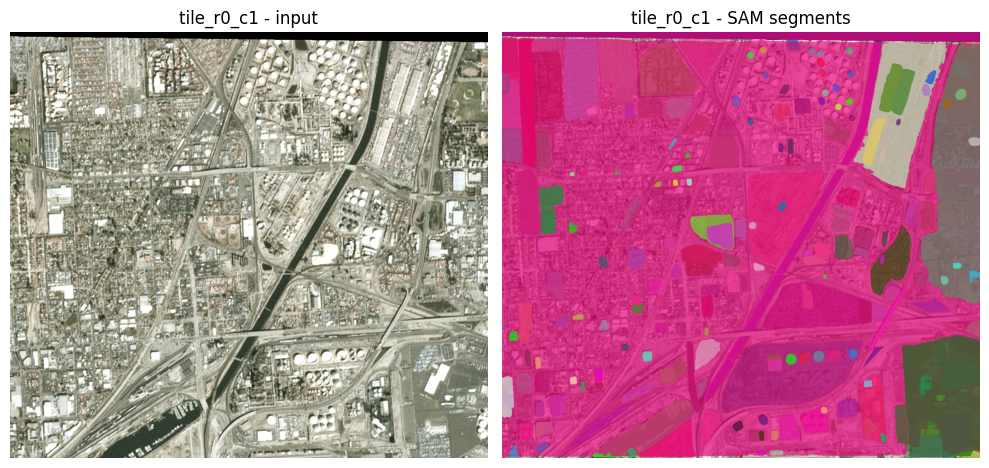


Processing tile_r0_c2 ...


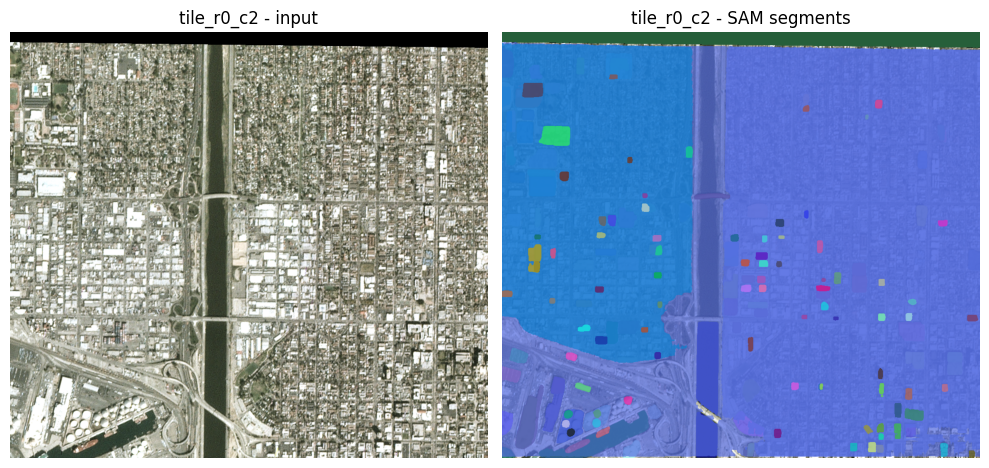


Processing tile_r0_c3 ...


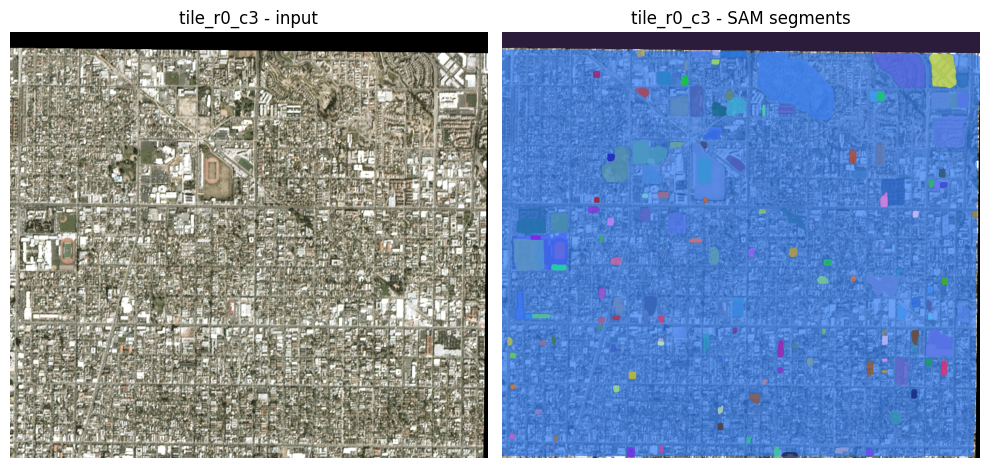


Processing tile_r1_c0 ...


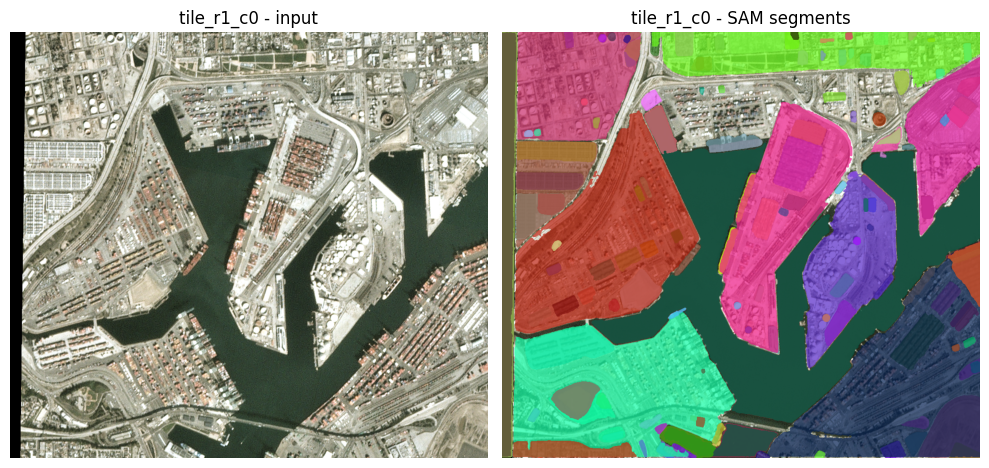


Processing tile_r1_c1 ...


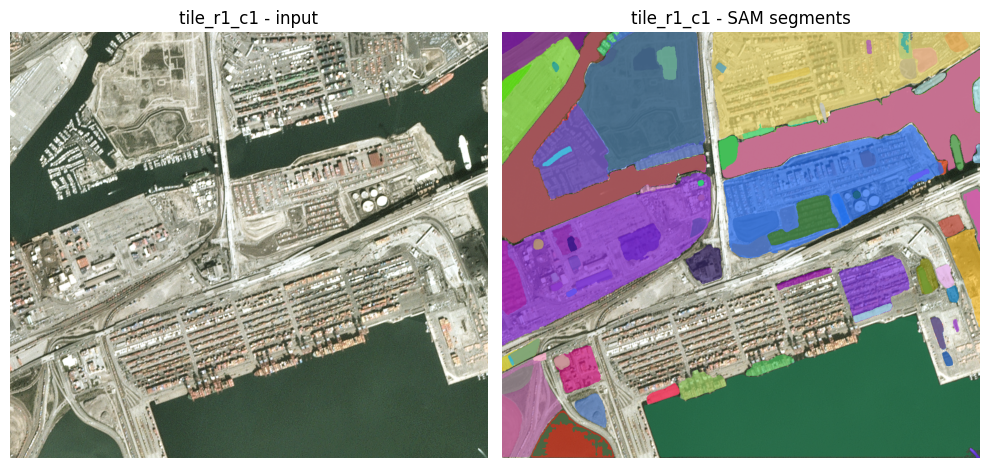


Processing tile_r1_c2 ...


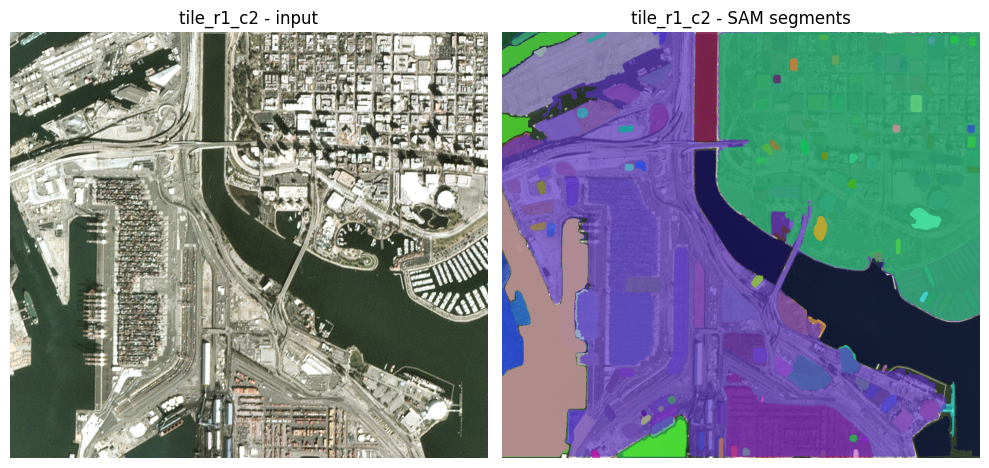


Processing tile_r1_c3 ...


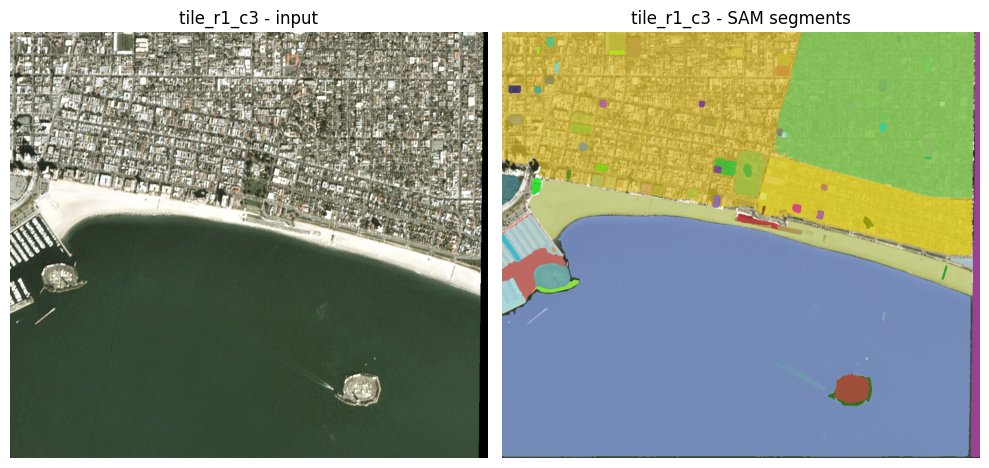


Processing tile_r2_c0 ...


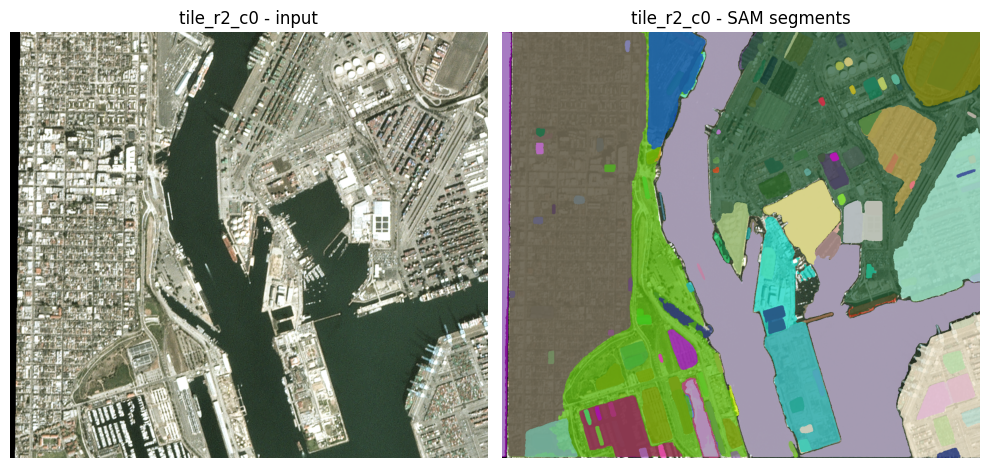


Processing tile_r2_c1 ...


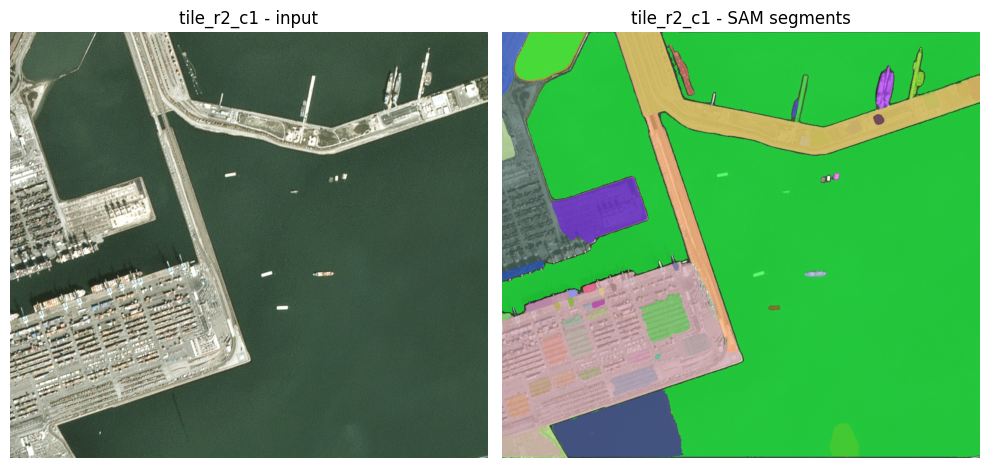


Processing tile_r2_c2 ...


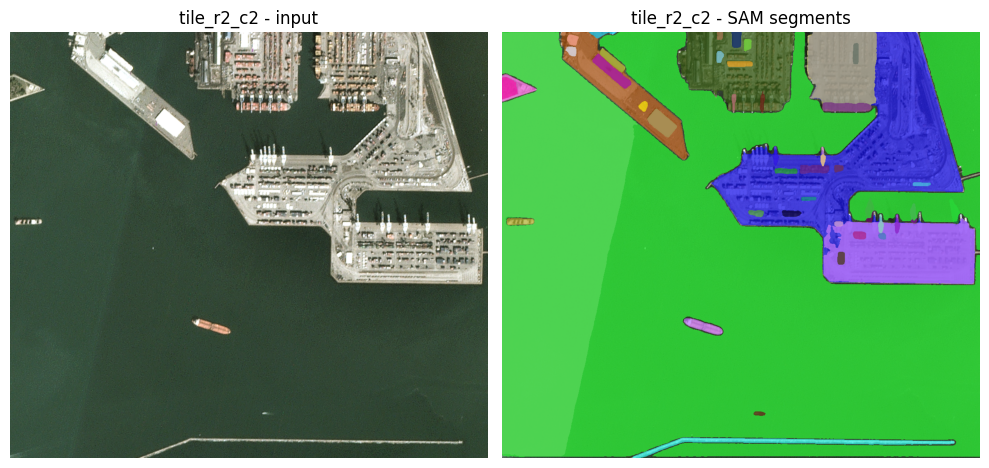


Processing tile_r2_c3 ...


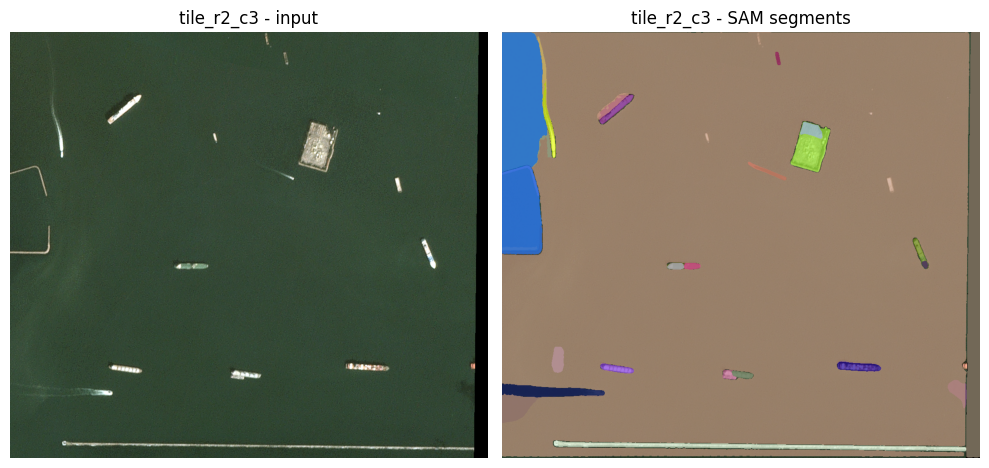


Processing tile_r3_c0 ...


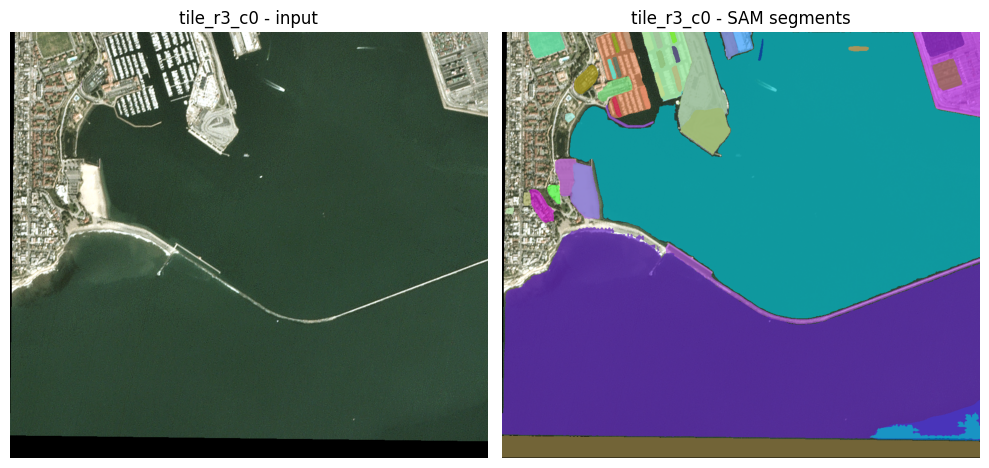


Processing tile_r3_c1 ...


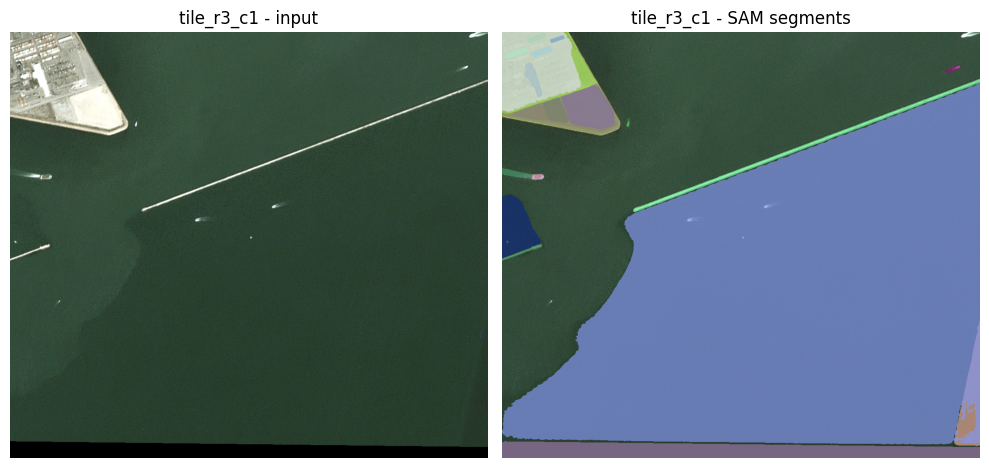


Processing tile_r3_c2 ...


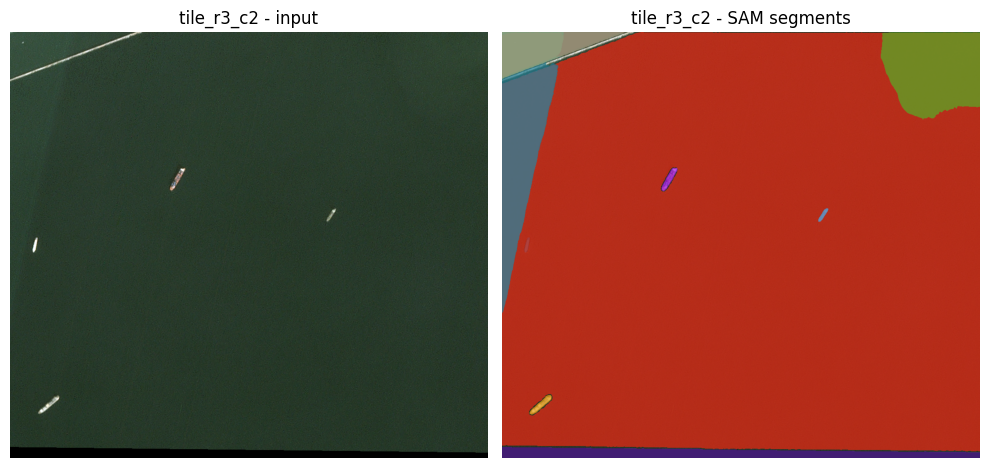


Processing tile_r3_c3 ...


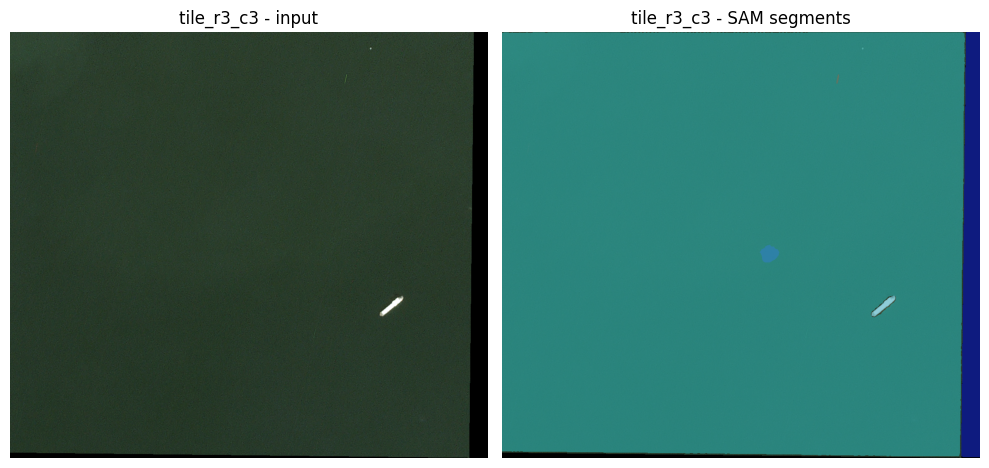


Number of segment polygons collected: 1707
GeoPackage written to: port_la_segments.gpkg


In [4]:
# === FULL PIPELINE (CPU FORCED): 4x4 TILES + SAM SEGMENTS -> GPKG WITH CRS ===
# Requirements:
#   - IMAGE_PATH points to your georeferenced satellite/orthophoto TIF
# Outputs:
#   - tiles_4x4/*.tif              (image tiles)
#   - tiles_4x4_overlays/*.tif     (SAM-colored overlays per tile)
#   - port_la_segments.gpkg        (all SAM segments, georeferenced, CRS from original TIF)

IMAGE_PATH = "merged_satellite_try2.tif"   # <-- your big GeoTIFF filename
GRID_N = 4                   # 4x4 = 16 tiles

import sys, subprocess, os

def pip_install(pkg):
    subprocess.check_call([sys.executable, "-m", "pip", "install", pkg])

# 0) OPTIONAL: If you're in a managed environment, you might comment this out.
# 1) Install dependencies (safe to re-run)
for pkg in [
    "opencv-python",
    "matplotlib",
    "Pillow",
    "numpy",
    "rasterio",
    "shapely",
    "geopandas",
    "affine",
    "git+https://github.com/facebookresearch/segment-anything.git",
]:
    pip_install(pkg)

# 2) Imports
import urllib.request
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import rasterio
from rasterio.features import shapes
from affine import Affine

import shapely.geometry as geom
import geopandas as gpd

import torch
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator

# -----------------------------
# CPU FORCE SECTION (key changes)
# -----------------------------
# Hide CUDA devices from PyTorch (extra safety)
os.environ["CUDA_VISIBLE_DEVICES"] = ""
device = torch.device("cpu")
print("torch.cuda.is_available():", torch.cuda.is_available())
print("Using device:", device)
# -----------------------------

# 3) Load TIF with rasterio (to get CRS + transform) and build RGB image
if not os.path.exists(IMAGE_PATH):
    raise FileNotFoundError(f"Image file '{IMAGE_PATH}' not found. Upload it via JupyterLab file browser.")

with rasterio.open(IMAGE_PATH) as src:
    data = src.read()           # (bands, H, W)
    transform = src.transform   # affine transform (pixel -> CRS)
    crs = src.crs               # CRS of the original raster
    print("Original CRS:", crs)
    print("Original transform:", transform)

# Convert to 3-channel RGB for SAM
if data.ndim != 3:
    raise ValueError("Expected a multi-band TIF (bands, H, W).")

bands, H, W = data.shape
if bands >= 3:
    rgb = np.zeros((H, W, 3), dtype=np.float32)
    for i in range(3):
        band = data[i].astype(np.float32)
        bmin, bmax = np.percentile(band, 2), np.percentile(band, 98)
        if bmax > bmin:
            band = (band - bmin) / (bmax - bmin)
        band = np.clip(band, 0, 1)
        rgb[..., i] = band
    image = (rgb * 255).astype("uint8")
elif bands == 1:
    band = data[0].astype(np.float32)
    bmin, bmax = np.percentile(band, 2), np.percentile(band, 98)
    if bmax > bmin:
        band = (band - bmin) / (bmax - bmin)
    band = np.clip(band, 0, 1)
    gray = (band * 255).astype("uint8")
    image = np.stack([gray, gray, gray], axis=-1)
else:
    raise ValueError("Unsupported number of bands in TIF.")

print("RGB image shape (H, W, 3):", image.shape)

# Quick look at the full image
plt.figure(figsize=(8, 8))
plt.imshow(image)
plt.axis("off")
plt.title("Full input image")
plt.show()

# 4) Split into GRID_N x GRID_N tiles and save each tile as a TIF (not georeferenced)
tiles_dir = "tiles_4x4"
os.makedirs(tiles_dir, exist_ok=True)

tile_h = H // GRID_N
tile_w = W // GRID_N

tiles = []  # list of (tile_img, row_start, col_start, tile_name)

for r in range(GRID_N):
    for c in range(GRID_N):
        row_start = r * tile_h
        col_start = c * tile_w

        # last row/col include remainder
        row_end = H if (r == GRID_N - 1) else (r + 1) * tile_h
        col_end = W if (c == GRID_N - 1) else (c + 1) * tile_w

        tile_img = image[row_start:row_end, col_start:col_end, :]
        tile_name = f"tile_r{r}_c{c}"
        tiles.append((tile_img, row_start, col_start, tile_name))

        # Save tile image as TIF (visual only, no CRS)
        Image.fromarray(tile_img).save(
            os.path.join(tiles_dir, tile_name + ".tif"),
            format="TIFF"
        )

print(f"Saved {len(tiles)} tiles in directory '{tiles_dir}'")

# 5) Download SAM checkpoint (you can keep vit_h, but CPU will be slow)
# If you want it faster on CPU, switch to vit_b:
#   ckpt_url = "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth"
#   ckpt_path = "sam_vit_b_01ec64.pth"
#   model_type = "vit_b"

ckpt_url = "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth"
ckpt_path = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

if not os.path.exists(ckpt_path):
    print("Downloading SAM checkpoint (one-time download)...")
    urllib.request.urlretrieve(ckpt_url, ckpt_path)
    print("Download complete:", ckpt_path)
else:
    print("Checkpoint already exists:", ckpt_path)

# 6) Load SAM model + automatic mask generator (CPU forced)
sam = sam_model_registry[model_type](checkpoint=ckpt_path)
sam.to(device=device)
sam.eval()

mask_generator = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32,
    pred_iou_thresh=0.86,
    stability_score_thresh=0.92,
    crop_n_layers=0,
    min_mask_region_area=500,  # in pixels; filter tiny blobs
)

overlay_dir = "tiles_4x4_overlays"
os.makedirs(overlay_dir, exist_ok=True)

# Lists to build GeoDataFrame
all_geoms = []
all_records = []

# 7) For each tile, run SAM, create overlay, extract polygons in CRS, add to GPKG list
rng = np.random.default_rng(seed=42)

for tile_img, row_start, col_start, tile_name in tiles:
    print(f"\nProcessing {tile_name} ...")

    masks = mask_generator.generate(tile_img)

    # Colored overlay
    overlay = tile_img.copy().astype(np.float32)

    # Compute tile-specific transform: offset from original
    tile_transform = transform * Affine.translation(col_start, row_start)

    for idx, m in enumerate(masks):
        seg = m["segmentation"].astype("uint8")

        # Color overlay for visualization
        color = rng.integers(0, 255, size=(3,), dtype=np.uint8)
        overlay[seg == 1] = overlay[seg == 1] * 0.3 + color * 0.7

        # Convert this segment mask to polygons in CRS coordinates
        for geom_mapping, value in shapes(seg, mask=(seg == 1), transform=tile_transform):
            poly = geom.shape(geom_mapping)
            if poly.is_empty or (not poly.is_valid):
                continue
            all_geoms.append(poly)
            all_records.append({
                "tile": tile_name,
                "mask_id": idx,
                "area_crs_units": poly.area,
            })

    # Save overlay for this tile
    overlay_uint8 = overlay.astype("uint8")
    Image.fromarray(overlay_uint8).save(
        os.path.join(overlay_dir, tile_name + "_segments.tif"),
        format="TIFF"
    )

    # Plot original vs overlay
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].set_title(f"{tile_name} - input")
    axs[0].imshow(tile_img)
    axs[0].axis("off")

    axs[1].set_title(f"{tile_name} - SAM segments")
    axs[1].imshow(overlay_uint8)
    axs[1].axis("off")

    plt.tight_layout()
    plt.show()

print("\nNumber of segment polygons collected:", len(all_geoms))

# 8) Build GeoDataFrame and write to GeoPackage with original CRS
if len(all_geoms) > 0:
    gdf = gpd.GeoDataFrame(all_records, geometry=all_geoms, crs=crs)
    gpkg_path = "port_la_segments.gpkg"
    gdf.to_file(gpkg_path, layer="segments", driver="GPKG")
    print("GeoPackage written to:", gpkg_path)
else:
    print("No segment polygons found; GeoPackage not created.")